<a href="https://colab.research.google.com/github/bolomg92/secciones_2022/blob/main/Klustering_espacial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Instalación e importación de las librerías a utilizar

---



In [ ]:
!pip install geopandas

In [151]:
import pandas as pd
import geopandas as gpd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
import folium

Importación del archivo con estadísticas a escalas geoelectorales obtenidas del INEGI y los poligonos geoelectorales, ambos almacenados en github.



In [156]:
url = 'https://raw.githubusercontent.com/bolomg92/secciones_2022/main/secciones_2020.csv'
datos = pd.read_csv(url)

In [ ]:
datos.head(100)

In [207]:
urlp = 'https://raw.githubusercontent.com/bolomg92/secciones_2022/main/Secciones_Electoral.geojson'
poligonos  = gpd.read_file(urlp)

In [ ]:
poligonos.plot()

Modificación el campo SECCION para poner los datos en el formato de clave geoestadística

In [209]:
datos['SECCION'] = datos['SECCION'].astype(str)
datos['SECCION'] = datos['SECCION'].str.rjust(4,'0')

In [ ]:
# Explorando los datos podemos apreciar que la columna SECCION cuenta con el formato 0001
datos.head(100)

Añadir la información del censo 2020 a los datos espaciales de las secciones electorales de la CDMX

In [ ]:
#Exploramos las columnas de los dataframe datos y poligonos  para identificar el campo en común
datos.columns

In [ ]:
poligonos.columns

In [214]:
# Trabajaremos con los porcentajes de la población ocupada y la población con educación posbásica para cada sección
datos['%_POCUPADA'] = (datos['POCUPADA'].values*100)/datos['POBTOT']
datos['%_P18YM_PB'] = (datos['P18YM_PB'].values*100)/datos['POBTOT']

In [215]:
#Para unir ambos dataframes, uniformamos los nombres del campo seccion en ambas tablas
poligonos = poligonos.rename(columns={' Sección':'SECCION'})

In [ ]:
#seleccionamos únicamente las columnas a utilizar
datos2 = datos[['%_POCUPADA', '%_P18YM_PB','SECCION']]
datos2

In [226]:
# Añadimos la información de interés a los datos espaciales
poligonos2 = pd.merge(poligonos, datos2, on='SECCION', how='left')

Procesamiento de los datos para el agrupamiento

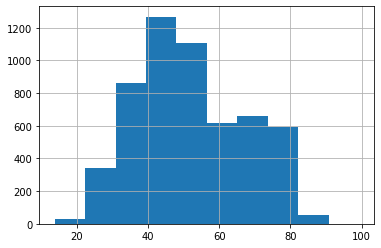

In [227]:
poligonos2['%_P18YM_PB'].hist()

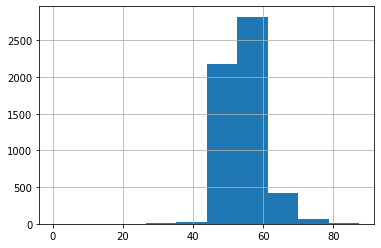

In [228]:
poligonos2['%_POCUPADA'].hist()

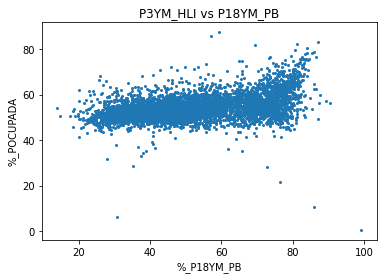

In [229]:
# grafica de dispersión demabas variables
y = poligonos2['%_POCUPADA'].values
x = poligonos2['%_P18YM_PB'].values
plt.xlabel('%_P18YM_PB')
plt.ylabel('%_POCUPADA')
plt.title('P3YM_HLI vs P18YM_PB')
plt.plot(x,y,'o',markersize=2)

In [ ]:
#Para el modelo, utilizaremos solamente las variables de interés
datos3 = datos2['SECCION']
datos2 = datos2.drop('SECCION', 1) 

In [231]:
datos2 = datos2.round().astype('Int64')

In [232]:
datos2.fillna(0, inplace=True)

In [ ]:
datos2

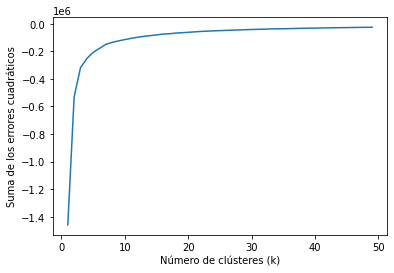

In [235]:
#para determinar el número óptimo de K, se usará la gráfica elbow
nc = range(1, 50) # donde 50 es el número de iteraciones que queremos hacer.
kmeans = [KMeans(n_clusters=i) for i in nc]
score = [kmeans[i].fit(datos2).score(datos2) for i in range(len(kmeans))]
score
plt.xlabel('Número de clústeres (k)')
plt.ylabel('Suma de los errores cuadráticos')
plt.plot(nc,score)

In [253]:
# Para mostrar las coordenadas de los 5 centroides
kmeans = KMeans(n_clusters=5).fit(datos2)
centroids = kmeans.cluster_centers_
print(centroids)

[[52.99942163 43.45806825]
 [64.66188525 76.81967213]
 [54.54231312 55.03808181]
 [51.08393782 31.3626943 ]
 [53.74652406 70.93903743]]


In [250]:
#%% Etiquetamos nuestro dataframe.
eti = kmeans.predict(datos2)
poligonos2['grupo'] = eti


In [261]:
datos2['grupo'] = eti
datos2

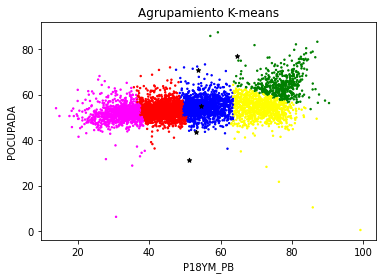

In [275]:
#%% Graficar el agrupamiento k-medias
colores=['red','green','blue','yellow','fuchsia']
asignar=[]
for row in eti:
  asignar.append(colores[row])
plt.scatter(x, y, c=asignar, s=2)
plt.scatter(centroids[:, 0], centroids[:, 1], marker='*', c='black', s=20) # Marco centroides.
plt.xlabel('P18YM_PB')
plt.ylabel('POCUPADA')
plt.title('Agrupamiento K-means')
plt.show()

In [264]:
#para orientar la tematización espacial, calcularemos los promedios de ambas variables en cada uno de los grupos
promedios = datos2.groupby("grupo", as_index=False).mean()

In [265]:
promedios

,grupo,%_POCUPADA,%_P18YM_PB
0,0,53.034662,43.738879
1,1,64.751553,76.786749
2,2,54.519685,55.327845
3,3,53.806311,71.16975
4,4,51.135323,31.60796


In [266]:
datos4.columns

Index(['SECCION', 'grupo'], dtype='object')

In [267]:
datos4 =poligonos2[['SECCION','grupo']]

Visualización espacial

In [280]:
def colores (gdf):
  if gdf ['properties']['grupo'] is 0:
    return 'yellow'
  if gdf ['properties']['grupo'] is 1: 
    return 'red'
  if gdf ['properties']['grupo'] is 3:
    return 'orange'
  if gdf ['properties']['grupo'] is 4 :
    return 'green'
  if gdf ['properties']['grupo'] is 2:
    return 'fuchsia'

In [ ]:
#Visualización en un mapa coroplético
m = folium.Map(location=[19.427568769300915, -99.13485703467343], zoom_start = 14)

folium.Choropleth(geo_data = poligonos2,
                  name = 'choropleth',
                  data = datos4,
                  columns = ['SECCION', 'grupo'],
                  key_on = 'feature.properties.SECCION',
                  fill_color= 'BuPu',
                  fill_opacity = 0.7,
                  line_opacity = 0.5,
                  legend_name ="grupos",
                  reset= True
                  ).add_to(m)

In [ ]:
m

In [281]:
#Visualización con un mapa con colores personalizados
m2 = folium.Map(location=[19.427568769300915, -99.13485703467343], zoom_start = 14)

folium.GeoJson(data = poligonos2,
               name = 'choropleth',
               style_function = lambda feature: {
                   'fillColor': colores(feature),
                   'color': colores(feature),
                   'fill' : True,
                   'fill_opacity' : '1'
                   }).add_to(m2)

In [293]:
 m2